In [1]:
# Common
import os 
import keras
import numpy as np 
import pandas as pd
from glob import glob
import tensorflow as tf
from IPython.display import clear_output as cls
from tensorflow.keras import regularizers
# Data 
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt

# Model 
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout

# Callbacks 
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Pre-Trained Model
from tensorflow.keras.applications import ResNet50V2

In [2]:
import os

# Define the directory path you want to create
directory_path = '/kaggle/working/split_data/train'  # Change the name as needed

# Check if the directory already exists
if not os.path.exists(directory_path):
    # Create the directory
    os.makedirs(directory_path)
    print(f"Directory '{directory_path}' created successfully.")
else:
    print(f"Directory '{directory_path}' already exists.")

Directory '/kaggle/working/split_data/train' created successfully.


In [3]:
import os

# Define the directory path you want to create
directory_path = '/kaggle/working/split_data/val'  # Change the name as needed

# Check if the directory already exists
if not os.path.exists(directory_path):
    # Create the directory
    os.makedirs(directory_path)
    print(f"Directory '{directory_path}' created successfully.")
else:
    print(f"Directory '{directory_path}' already exists.")

Directory '/kaggle/working/split_data/val' created successfully.


In [4]:
import os
import shutil
import random

def split_dataset(source_dir, train_dir, val_dir, split_ratio=0.1):
    # Create train and val directories
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)

    # Iterate through each class directory
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        
        # Check if it's a directory
        if os.path.isdir(class_path):
            # Create class directories in train and val
            os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
            os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)

            # Get all images in the class directory
            images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            random.shuffle(images)  # Shuffle the images

            # Calculate split index
            split_index = int(len(images) * (1 - split_ratio))

            # Split images into train and val
            train_images = images[:split_index]
            val_images = images[split_index:]

            # Move images to train directory
            for image in train_images:
                shutil.copy(os.path.join(class_path, image), os.path.join(train_dir, class_name, image))

            # Move images to val directory
            for image in val_images:
                shutil.copy(os.path.join(class_path, image), os.path.join(val_dir, class_name, image))

    print("Dataset split completed!")

# Example usage
source_directory = '/kaggle/input/vlg-recruitment-24-challenge/vlg-dataset/vlg-dataset/train'  # Replace with your dataset path
train_directory = '/kaggle/working/split_data/train'  # Replace with your desired train path
val_directory = '/kaggle/working/split_data/val'  # Replace with your desired val path

split_dataset(source_directory, train_directory, val_directory, split_ratio=0.1)

#additional data
#split_dataset('/kaggle/input/animal-image-dataset-90-different-animals/animals/animals', train_directory, val_directory, split_ratio=0.1)

Dataset split completed!


In [5]:
# Class Names
root_path = train_directory
valid_path = val_directory
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)


# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 40 
Class Names : ['antelope', 'bat', 'beaver', 'blue+whale', 'bobcat', 'buffalo', 'chihuahua', 'cow', 'dalmatian', 'deer', 'dolphin', 'elephant', 'german+shepherd', 'giant+panda', 'giraffe', 'grizzly+bear', 'hamster', 'hippopotamus', 'humpback+whale', 'killer+whale', 'leopard', 'lion', 'mole', 'mouse', 'otter', 'ox', 'persian+cat', 'pig', 'polar+bear', 'raccoon', 'rat', 'seal', 'siamese+cat', 'skunk', 'spider+monkey', 'tiger', 'walrus', 'weasel', 'wolf', 'zebra']


In [6]:
# Initialize Generator
train_gen = ImageDataGenerator(rescale=1/255., rotation_range=10, horizontal_flip=True)
valid_gen = ImageDataGenerator(rescale=1/255.)

# Load Data
train_ds = train_gen.flow_from_directory(root_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32) 
valid_ds = valid_gen.flow_from_directory(valid_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 8587 images belonging to 40 classes.
Found 957 images belonging to 40 classes.


In [7]:
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_ds):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(len(images))
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
            cls()
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

In [8]:
def load_image(path):
    '''This function will load the image present at the given location'''
    image = tf.cast(tf.image.resize(img_to_array(load_img(path))/255., (256,256)), tf.float32)
    return image
def show_image(image, title=None):
    plt.imshow(image)
    plt.axis('off')
    plt.title(title)

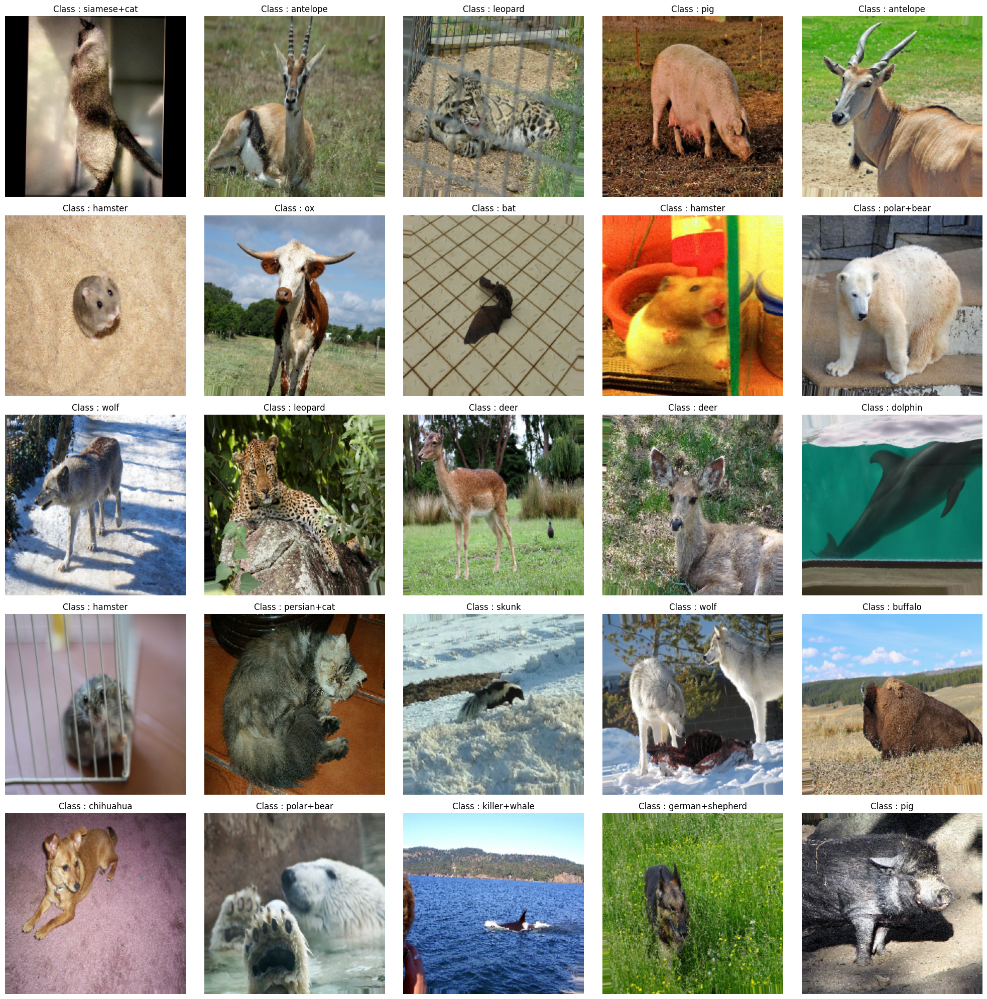

In [9]:
show_images(data=train_ds)

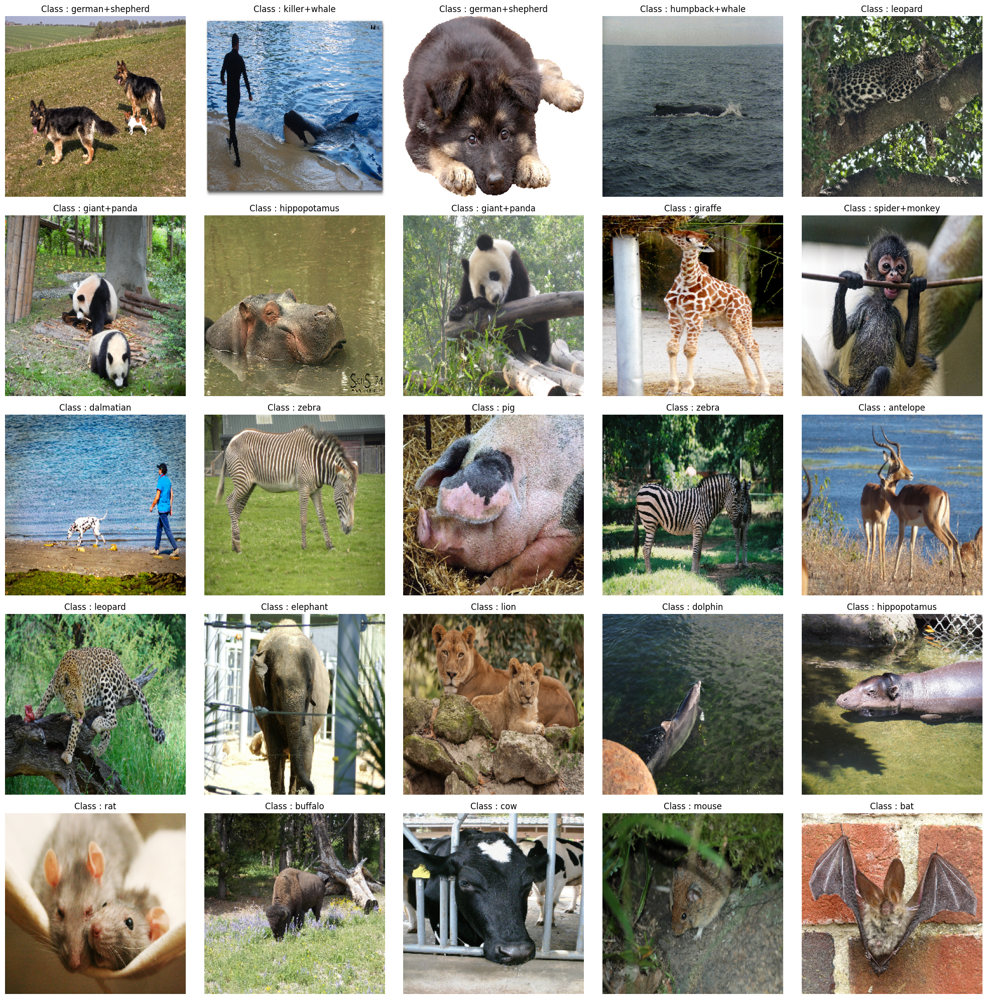

In [10]:
show_images(data=valid_ds)

In [11]:
from keras.models import Model
from keras.layers import Input, Dense, GlobalAveragePooling2D
with tf.device("/GPU:0"):
    ## Pre-Trained Model 
    base_model = ResNet50V2(input_shape=(256,256,3), include_top=False)
    input_shape = (256, 256, 3)
    input_layer = Input(shape=input_shape)
    x = base_model(input_layer)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu', kernel_initializer='he_normal', kernel_regularizer=regularizers.l2(0.01))(x)
    x = Dropout(0.4)(x)
    output_layer = Dense(n_classes, activation='softmax', kernel_regularizer=regularizers.l2(0.01))(x)
    name = "ResNet50V2"
    cls()
    model = Model(inputs=input_layer, outputs=output_layer, name=name)

    # Callbacks
    cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(name + ".keras", save_best_only=True)]
    # Model 
    opt = tf.keras.optimizers.Adam(learning_rate=2e-4)
    base_model.trainable = False
    model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

    # Model Training
    history = model.fit(train_ds, validation_data=valid_ds, callbacks=cbs, epochs=50)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


269/269 ━━━━━━━━━━━━━━━━━━━━ 197s 659ms/step - accuracy: 0.3797 - loss: 7.6111 - val_accuracy: 0.8307 - val_loss: 4.1384
Epoch 2/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 164s 595ms/step - accuracy: 0.7924 - loss: 3.9777 - val_accuracy: 0.8558 - val_loss: 3.0463
Epoch 3/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 165s 599ms/step - accuracy: 0.8369 - loss: 2.9746 - val_accuracy: 0.8548 - val_loss: 2.4065
Epoch 4/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 165s 598ms/step - accuracy: 0.8561 - loss: 2.3293 - val_accuracy: 0.8694 - val_loss: 1.9353
Epoch 5/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 166s 602ms/step - accuracy: 0.8722 - loss: 1.8841 - val_accuracy: 0.8777 - val_loss: 1.6178
Epoch 6/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 165s 597ms/step - accuracy: 0.8799 - loss: 1.5715 - val_accuracy: 0.8746 - val_loss: 1.3977
Epoch 7/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 165s 596ms/step - accuracy: 0.8859 - loss: 1.3709 - val_accuracy: 0.8830 - val_loss: 1.2339
Epoch 8/50
269/269 ━━━━━━━━━━━━━━━━━━━━ 165s 596ms/step - accuracy: 0.8825 - loss: 1.22

In [12]:
with tf.device("/GPU:0"):
    ## Pre-Trained Model 
    base_model.trainable = True
    cls()

    # Callbacks
    cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(name + ".keras", save_best_only=True)]

    # Model 
    opt = tf.keras.optimizers.Adam(learning_rate=1e-6)
    model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
     # Model Training
    history = model.fit(train_ds, validation_data=valid_ds, callbacks=cbs, epochs=70)

Epoch 1/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 249s 720ms/step - accuracy: 0.7850 - loss: 1.5142 - val_accuracy: 0.8631 - val_loss: 1.0814
Epoch 2/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 169s 612ms/step - accuracy: 0.8379 - loss: 1.3376 - val_accuracy: 0.8683 - val_loss: 1.0491
Epoch 3/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 169s 610ms/step - accuracy: 0.8423 - loss: 1.2512 - val_accuracy: 0.8725 - val_loss: 1.0037
Epoch 4/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 169s 612ms/step - accuracy: 0.8597 - loss: 1.1837 - val_accuracy: 0.8757 - val_loss: 0.9681
Epoch 5/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 169s 614ms/step - accuracy: 0.8662 - loss: 1.1383 - val_accuracy: 0.8809 - val_loss: 0.9396
Epoch 6/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 169s 612ms/step - accuracy: 0.8686 - loss: 1.1038 - val_accuracy: 0.8819 - val_loss: 0.9194
Epoch 7/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 170s 614ms/step - accuracy: 0.8799 - loss: 1.0669 - val_accuracy: 0.8830 - val_loss: 0.9010
Epoch 8/70
269/269 ━━━━━━━━━━━━━━━━━━━━ 170s 615ms/step - accuracy: 0.8852 -

In [13]:
data = pd.DataFrame(history.history)

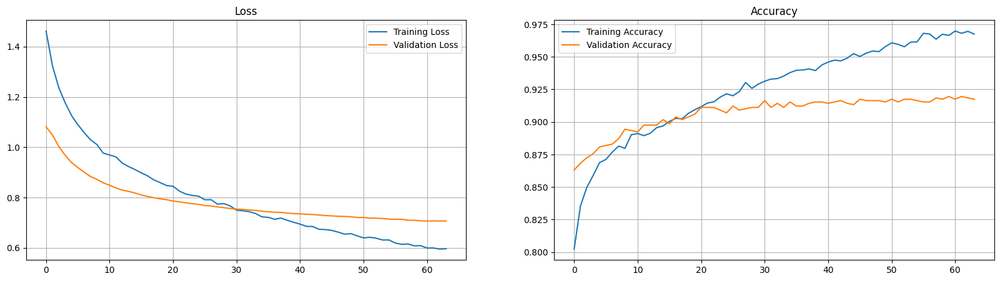

In [14]:
plt.figure(figsize=(20,5))

plt.subplot(1,2,1)
plt.plot(data.loss, label='Training Loss')
plt.plot(data.val_loss, label='Validation Loss')
plt.title("Loss")
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(data.accuracy, label='Training Accuracy')
plt.plot(data.val_accuracy, label='Validation Accuracy')
plt.title("Accuracy")
plt.grid()
plt.legend()

plt.show()

In [15]:
import tensorflow as tf
model.summary()
model = tf.keras.models.load_model('/kaggle/working/ResNet50V2.keras')
model.evaluate(valid_ds)

Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50v2 (Functional)              │ (None, 8, 8, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 40)                  │          10,280 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,207,994 (275.45 MB)

 Trainable params: 24,054,184 (91.76 MB)

 Non-trainable params: 45,440 (177.50 KB)

 Optimizer params: 48,108,370 (183.52 MB)

30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 295ms/step - accuracy: 0.9108 - loss: 0.7108


[0.706655740737915, 0.9174503684043884]

In [16]:
import torch
test_dir = '/kaggle/input/vlg-recruitment-24-challenge/vlg-dataset/vlg-dataset/test'
animals = os.listdir('/kaggle/input/vlg-recruitment-24-challenge/vlg-dataset/vlg-dataset/train')

test_images = [f for f in os.listdir(test_dir) if f.endswith('.jpg')]
test_predictions = []

for img_name in test_images:
    img_path = os.path.join(test_dir, img_name)
    image = load_image(img_path)

    with torch.no_grad():
        preds = model.predict(image[np.newaxis, ...])[0]
        pred_class = class_names[np.argmax(preds)]
        test_predictions.append((img_name, pred_class))
        # Get the indices of the predictions sorted by confidence
        #sorted_indices = np.argsort(preds)[::-1]  # Sort in descending order

        # Iterate through the sorted predictions
        #for n in sorted_indices:
            #pred_class = class_names[n]
            #if pred_class in animals:
                #test_predictions.append((img_name, pred_class))
                #break

# Save Predictions
submission = pd.DataFrame(test_predictions, columns=['image_id', 'class'])
submission.to_csv("/kaggle/working/predictions.csv", index=False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━